# INTRODUCTION
IS833

April 30, 2020

Credit Card Approval Prediction

## TEAM 1
MICHAEL RASHKOV, BRUNO GONZALEZ, TAMKEEN ISLAM, DAVID VEGA, JAMES OZIGBO

## PROJECT GOAL


Predict whether a credit card application will be approved based on classification of applicants using their characteristics (demographics, income, etc.). We will use statistical and data science tools such as Logistic Regression, Decision Tree, Random Forest, Support Vector Classifications, etc. to analyze the data.

## SUMMARY

Target Variable: Clients are assigned a target variable of 1 if they had at least one record of 30 days or more overdue payments in their credit history and 0 otherwise. 1 means that the client *will not* be offered a credit card.


We used the following classification models to predict the target variable:
1.	Decision Tree
2.	Random Forest
3.	Support Vector Machine
4.	K-NN
5.	Logistic Regression
6.	Gaussian NB
7.	XGBoost
8.	Extra Trees Classifier
9.	Stacking Classifier

The Stacking Classifier performed best on the test data, with AUC of 0.799 and weighted average recall of 0.86.

The K-NN Classifier had the highest recall (0.51) for Target Variable=1.


**Data preprocessing steps:**

After the initial cleaning and merging of the datasets (explained in detail in the next cell), we split the train and test data in 70-30 proportion.

We applied the SMOTE algorithm (Synthetic Minority Over-sampling Technique) to the training data since our target variable is relatively underrepresented in the data. SMOTE balances the two classes and improves the classification models’ predictive power on the target variable.

We also scaled the data in the feature matrix so it has mean=0 and st.d.=1 using sklearn’s StandardScaler(), because some classification models work with scaled data. This did not reduce the performace of the models which don't require scaling to work. 

After running the classification models, we also performed PCA analysis and used unsupervised learning algorithms K-Means and Spectral Co-Clustering to identify potential clusters in the data which can be examined separately as a step in further analysis of the data.


## DATA DESCRIPTION AND FINDINGS

There are two csv datasets:
*   **application_record**: 438,557 records, 18 variables (incl. ID)

*   **credit_record**: 1,048,575 records, 3 variables (incl. ID). Note that the credit_record data is limited by the max number of rows in Excel

The data dictionary is in the next cell.

**FINDINGS:**

**"application_record":**

Contains features (variables) of the population of potential credit card applicants (demographic information, income, etc.)

There are 94 duplicate records (ID's) in "application_record" (incorrectly recorded data, since ID should be unique). We remove both instances of the duplicate records.

DAYS_BIRTH and DAYS_EMPLOYED were recorded as negative numbers. We converted them to positive and divided by 365 to get clients' age and work tenure in years (after which we renamed the variables).

Before that step, we also found 75,329 incorrect records where DAYS_EMPLOYED==365243 (large positive values where all other values were negative) and we set them to NaN.

We also identified 134,203 missing values in "OCCUPATION_TYPE". We can perform further analysis by:
1. Filling the missing values with mean values
2. Dropping records with missing values
3. Dropping the "OCCUPATION_TYPE" variable

**"credit_record":**

Contains payment history (paid in full, overdue by certain number of days, etc.) for potential credit card applicants.

We created the target variable using this dataset. The target variable "Y" is set to 1 for high risk candidates (who had at least one month of overdue payments by 30 days or more in their credit history). We found that 13.3% of the candidates fall in the "Y" category (after removing records with missing values).

**Combined Data:**

After the initial data cleaning, we merged **"application_record"** and  **"credit_record"**. The resulting dataset has 33,110 records (27,468 after dropping records with missing values). Then, we created dummy variables for the categorical variables in the dataset. 

**EDA using graphs:**

From the merged dataset, we created one chart for each of the variables to analyze all the different values in each column.

From this data we found that there are twice as much females than men in the population. 50% of the population is between 34 to 53 years old with an average age of 43.3 years.

The predominant occupation of the population is accountant with 7K records. More than 20K people have an education attainment of secondary school and 10K have higher education studies. Most of the population have less than 10 years of employment, with a mean of 6.79 years.

30K of the population have 0 or 1 children with an average of 0.43 children for the total population. The mean of family members is 2.19 and nearly 30K of the people live in their own apartment.

**Feature Importance:**

We used a Random Forest Classifier to estimate the importance of the different features for predicting the target varibale. We found the following features to have the highest importance: INCOME, YEARS_BIRTH, YEARS_EMPLOYED.

**Graphs of relationship between target variable and other variables:**

We created various graphs showing how the target variable "Y" differs in relation to other variables like Income, Family Status, Education Type, Gender, Years Employed, and Income Type.



## **DATA DICTIONARY**

Variable | Definition
--- | ---
ID | Client number
CODE_GENDER | Gender of the client
FLAG_OWN_CAR | If the client has a car
FLAG_OWN_REALTY | If the client has real estate property
CNT_CHILDREN | Number of children of the client
AMT_INCOME_TOTAL | Annual income of the client
NAME_INCOME_TYPE | Type of the income of the client
NAME_EDUCATION_TYPE | Education level of the client
NAME_FAMILY_STATUS | Marital status of the client
NAME_HOUSING_TYPE | Type of housing of the client
DAYS_BIRTH | Age of the client in days (renamed to YEARS_BIRTH)
DAYS_EMPLOYED | Employment tenure of the client in days (renamed to YEARS_EMPLOYED)
FLAG_MOBIL | Client Mobile phone: Yes/No
FLAG_WORK_PHONE | Client Work phone: Yes/No
FLAG_PHONE | Client Phone: Yes/No
FLAG_EMAIL | Client Email: Yes/No
OCCUPATION_TYPE | Type of the occupation of the client
CNT_FAM_MEMBERS | Number of family members of the client
MONTHS_BALANCE |	Month when the credit record was made.	The month of the extracted data is the starting point, backwards, 0 is the current month, -1 is the previous month, and so on. 
STATUS | Payment status of the client for the given month.	
0: | 1-29 days past due 
1: | 30-59 days past due 
2: | 60-89 days overdue 
3: | 90-119 days overdue 
4: | 120-149 days overdue 
5: | Overdue or bad debts, write-offs for more than 150 days 
C: | Paid off that month 
X: | No loan for the month

# IMPORTING MODULES

In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
from IPython.display import Pretty as disp

from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score

from sklearn import metrics 
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from sklearn.metrics import consensus_score

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.svm import LinearSVC
import xgboost as xgb

from imblearn.over_sampling import SMOTE

from sklearn.preprocessing import scale
from sklearn.preprocessing import StandardScaler

from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.ensemble import IsolationForest
from sklearn.ensemble import GradientBoostingClassifier

from sklearn.datasets import make_classification
from sklearn.datasets import make_biclusters

from sklearn.pipeline import make_pipeline

from sklearn.cluster import SpectralCoclustering
from sklearn.cluster import KMeans

from sklearn.decomposition import PCA

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm
/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)


In [0]:
sns.set_style('white')

# IMPORTING DATA

In [3]:
from google.colab import drive

drive.mount('/content/drive')

drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/drive
Mounted at /content/gdrive


In [4]:
ls

ls: cannot access 'drive': Transport endpoint is not connected
drive/  gdrive/  sample_data/


In [0]:
# Reading in "application_record.csv"

data = pd.read_csv('/content/gdrive/Shared drives/IS833 - Project/application_record.csv', encoding = 'utf-8')


# EDA AND DATA CLEANING

## Exploring data "application_record.csv"

In [6]:
data.head()

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS
0,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0
1,5008805,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0
2,5008806,M,Y,Y,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,-21474,-1134,1,0,0,0,Security staff,2.0
3,5008808,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0
4,5008809,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0


In [7]:
# The data has 438,557 rows and 18 columns.

data.shape

(438557, 18)

In [8]:
# We see that "OCCUPATION_TYPE" has missing values

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 438557 entries, 0 to 438556
Data columns (total 18 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   ID                   438557 non-null  int64  
 1   CODE_GENDER          438557 non-null  object 
 2   FLAG_OWN_CAR         438557 non-null  object 
 3   FLAG_OWN_REALTY      438557 non-null  object 
 4   CNT_CHILDREN         438557 non-null  int64  
 5   AMT_INCOME_TOTAL     438557 non-null  float64
 6   NAME_INCOME_TYPE     438557 non-null  object 
 7   NAME_EDUCATION_TYPE  438557 non-null  object 
 8   NAME_FAMILY_STATUS   438557 non-null  object 
 9   NAME_HOUSING_TYPE    438557 non-null  object 
 10  DAYS_BIRTH           438557 non-null  int64  
 11  DAYS_EMPLOYED        438557 non-null  int64  
 12  FLAG_MOBIL           438557 non-null  int64  
 13  FLAG_WORK_PHONE      438557 non-null  int64  
 14  FLAG_PHONE           438557 non-null  int64  
 15  FLAG_EMAIL       

In [9]:
# Counting how many null values are there

data.isnull().sum()

ID                          0
CODE_GENDER                 0
FLAG_OWN_CAR                0
FLAG_OWN_REALTY             0
CNT_CHILDREN                0
AMT_INCOME_TOTAL            0
NAME_INCOME_TYPE            0
NAME_EDUCATION_TYPE         0
NAME_FAMILY_STATUS          0
NAME_HOUSING_TYPE           0
DAYS_BIRTH                  0
DAYS_EMPLOYED               0
FLAG_MOBIL                  0
FLAG_WORK_PHONE             0
FLAG_PHONE                  0
FLAG_EMAIL                  0
OCCUPATION_TYPE        134203
CNT_FAM_MEMBERS             0
dtype: int64

### Checking for Incorrect Data

In [10]:
# Inspecting the data for outliers
# We notice that "DAYS_BIRTH" and "DAYS_EMPLOYED" are recorder as negative values. Will convert to positive later.
# We notice that "DAYS_EMPLOYED" has both positive and negative values => incorrect. Will examine further.

data.describe()       # Only describes numerical variables

,ID,CNT_CHILDREN,AMT_INCOME_TOTAL,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS
count,4.385570e+05,438557.000000,4.385570e+05,438557.000000,438557.000000,438557.0,438557.000000,438557.000000,438557.000000,438557.000000
mean,6.022176e+06,0.427390,1.875243e+05,-15997.904649,60563.675328,1.0,0.206133,0.287771,0.108207,2.194465
std,5.716370e+05,0.724882,1.100869e+05,4185.030007,138767.799647,0.0,0.404527,0.452724,0.310642,0.897207
min,5.008804e+06,0.000000,2.610000e+04,-25201.000000,-17531.000000,1.0,0.000000,0.000000,0.000000,1.000000
25%,5.609375e+06,0.000000,1.215000e+05,-19483.000000,-3103.000000,1.0,0.000000,0.000000,0.000000,2.000000
50%,6.047745e+06,0.000000,1.607805e+05,-15630.000000,-1467.000000,1.0,0.000000,0.000000,0.000000,2.000000
75%,6.456971e+06,1.000000,2.250000e+05,-12514.000000,-371.000000,1.0,0.000000,1.000000,0.000000,3.000000
max,7.999952e+06,19.000000,6.750000e+06,-7489.000000,365243.000000,1.0,1.000000,1.000000,1.000000,20.000000


In [11]:
# Incorrect data in "DAYS_EMPLOYED". 75,329 records have DAYS_EMPLOYED==365243 while the other values are negative.

data[data["DAYS_EMPLOYED"] >= 0]

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS
7,5008812,F,N,Y,0,283500.0,Pensioner,Higher education,Separated,House / apartment,-22464,365243,1,0,0,0,NaN,1.0
8,5008813,F,N,Y,0,283500.0,Pensioner,Higher education,Separated,House / apartment,-22464,365243,1,0,0,0,NaN,1.0
9,5008814,F,N,Y,0,283500.0,Pensioner,Higher education,Separated,House / apartment,-22464,365243,1,0,0,0,NaN,1.0
76,5008884,F,N,Y,0,315000.0,Pensioner,Secondary / secondary special,Widow,House / apartment,-20186,365243,1,0,0,0,NaN,1.0
160,5008974,F,N,Y,0,112500.0,Pensioner,Secondary / secondary special,Married,House / apartment,-22319,365243,1,0,0,0,NaN,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
438549,6840098,F,N,Y,0,135000.0,Pensioner,Secondary / secondary special,Separated,House / apartment,-22717,365243,1,0,0,0,NaN,1.0
438550,6840100,F,N,Y,0,135000.0,Pensioner,Secondary / secondary special,Separated,House / apartment,-22717,365243,1,0,0,0,NaN,1.0
438551,6840102,F,N,Y,0,135000.0,Pensioner,Secondary / secondary special,Separated,House / apartment,-22717,365243,1,0,0,0,NaN,1.0
438552,6840104,M,N,Y,0,135000.0,Pensioner,Secondary / secondary special,Separated,House / apartment,-22717,365243,1,0,0,0,NaN,1.0


In [12]:
# Checking how many unique positive values are there for "DAYS_EMPLOYED". Only one (365243).

data["DAYS_EMPLOYED"][data["DAYS_EMPLOYED"] >= 0].nunique()

1

SETTING THE INCORRECT "DAYS_EMPLOYED" TO NaN



In [13]:
# Replacing incorrect DAYS_EMPLOYED==365243 with NaN

data["DAYS_EMPLOYED"].replace(365243, np.NaN, inplace=True)
data

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS
0,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542.0,1,1,0,0,NaN,2.0
1,5008805,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542.0,1,1,0,0,NaN,2.0
2,5008806,M,Y,Y,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,-21474,-1134.0,1,0,0,0,Security staff,2.0
3,5008808,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051.0,1,0,1,1,Sales staff,1.0
4,5008809,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051.0,1,0,1,1,Sales staff,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
438552,6840104,M,N,Y,0,135000.0,Pensioner,Secondary / secondary special,Separated,House / apartment,-22717,NaN,1,0,0,0,NaN,1.0
438553,6840222,F,N,N,0,103500.0,Working,Secondary / secondary special,Single / not married,House / apartment,-15939,-3007.0,1,0,0,0,Laborers,1.0
438554,6841878,F,N,N,0,54000.0,Commercial associate,Higher education,Single / not married,With parents,-8169,-372.0,1,1,0,0,Sales staff,1.0
438555,6842765,F,N,Y,0,72000.0,Pensioner,Secondary / secondary special,Married,House / apartment,-21673,NaN,1,0,0,0,NaN,2.0


In [14]:
# Checking that there are no more DAYS_EMPLOYED==365243

data[["DAYS_EMPLOYED"]][data["DAYS_EMPLOYED"] == 365243]

,DAYS_EMPLOYED


In [15]:
# Checking which values are missing now

data.isnull().sum()

ID                          0
CODE_GENDER                 0
FLAG_OWN_CAR                0
FLAG_OWN_REALTY             0
CNT_CHILDREN                0
AMT_INCOME_TOTAL            0
NAME_INCOME_TYPE            0
NAME_EDUCATION_TYPE         0
NAME_FAMILY_STATUS          0
NAME_HOUSING_TYPE           0
DAYS_BIRTH                  0
DAYS_EMPLOYED           75329
FLAG_MOBIL                  0
FLAG_WORK_PHONE             0
FLAG_PHONE                  0
FLAG_EMAIL                  0
OCCUPATION_TYPE        134203
CNT_FAM_MEMBERS             0
dtype: int64

CONVERTING "AMT_INCOME_TOTAL" TO THOUSANDS AND RENAMING

In [0]:
# Converting income to thousands for easier interpretation and visual representation

data["AMT_INCOME_TOTAL"] = data["AMT_INCOME_TOTAL"] / 1000

# Renaming column

data.rename(columns={'AMT_INCOME_TOTAL': 'INCOME'}, inplace=True)

CONVERTING NEGATIVE  DAYS_BIRTH and DAYS_EMPLOYED TO POSITIVE YEARS AND ROUNDING (DIVIDING BY 365) - ALSO RENAMING

In [17]:
# Converting negative days to positive years (rounded)

data["DAYS_BIRTH"] = -data["DAYS_BIRTH"] // 365
data["DAYS_EMPLOYED"] = -data["DAYS_EMPLOYED"] // 365

#Renaming columns

data.rename(columns={"DAYS_BIRTH": "YEARS_BIRTH", 
                     "DAYS_EMPLOYED": "YEARS_EMPLOYED"}, 
                      inplace=True)

data.describe()

,ID,CNT_CHILDREN,INCOME,YEARS_BIRTH,YEARS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS
count,4.385570e+05,438557.000000,438557.000000,438557.000000,363228.000000,438557.0,438557.000000,438557.000000,438557.000000,438557.000000
mean,6.022176e+06,0.427390,187.524286,43.326489,6.684196,1.0,0.206133,0.287771,0.108207,2.194465
std,5.716370e+05,0.724882,110.086853,11.467500,6.579149,0.0,0.404527,0.452724,0.310642,0.897207
min,5.008804e+06,0.000000,26.100000,20.000000,0.000000,1.0,0.000000,0.000000,0.000000,1.000000
25%,5.609375e+06,0.000000,121.500000,34.000000,2.000000,1.0,0.000000,0.000000,0.000000,2.000000
50%,6.047745e+06,0.000000,160.780500,42.000000,5.000000,1.0,0.000000,0.000000,0.000000,2.000000
75%,6.456971e+06,1.000000,225.000000,53.000000,9.000000,1.0,0.000000,1.000000,0.000000,3.000000
max,7.999952e+06,19.000000,6750.000000,69.000000,48.000000,1.0,1.000000,1.000000,1.000000,20.000000


In [18]:
# Creating a sample pivot table of some of the variables

data.pivot_table(values="INCOME", index=["CODE_GENDER", "NAME_EDUCATION_TYPE"], aggfunc='mean')

INCOME
CODE_GENDER NAME_EDUCATION_TYPE                      
F           Academic degree                233.049801
            Higher education               209.278104
            Incomplete higher              188.778501
            Lower secondary                128.601536
            Secondary / secondary special  160.690291
M           Academic degree                272.139344
            Higher education               262.128046
            Incomplete higher              232.700617
            Lower secondary                166.989215
            Secondary / secondary special  195.433078

In [19]:
# Creating a sample value count for one variable

data["CODE_GENDER"].value_counts()

F    294440
M    144117
Name: CODE_GENDER, dtype: int64

## Exploring data "credit_record.csv"

In [0]:
# Reading in the data "credit_record.csv"

record = pd.read_csv("/content/gdrive/Shared drives/IS833 - Project/credit_record.csv", encoding = 'utf-8')

In [21]:
record.head(5)

,ID,MONTHS_BALANCE,STATUS
0,5001711,0,X
1,5001711,-1,0
2,5001711,-2,0
3,5001711,-3,0
4,5001712,0,C


In [22]:
# The data has 1,048,575 rows and 3 columns.

record.shape

(1048575, 3)

In [23]:
# Counting unique ID's in "credit_record.csv" 

len(record["ID"].unique())

45985

### Finding Duplicate ID's in "application_record.csv"

In [24]:
# All data instances

data.shape

(438557, 18)

In [25]:
# All unique ID's

len(data["ID"].unique())

438510

In [26]:
# The number of instances is 47 larger than the unique ID's => there are duplicate ID's

data.shape[0] - len(data["ID"].unique())

47

In [27]:
# Creating boolean for duplicate ID's

duplicates = pd.DataFrame(data.groupby("ID")["ID"].count() > 1)
duplicates.rename(columns={'ID':'dup_record'}, inplace=True)
duplicates

,dup_record
ID,
5008804,False
5008805,False
5008806,False
5008808,False
5008809,False
...,...
7999660,False
7999696,False
7999738,False


In [28]:
# Checking where "dup_record" is True

duplicates[duplicates["dup_record"] == True].head()

,dup_record
ID,
7022197,True
7022327,True
7023108,True
7023651,True
7024111,True


In [29]:
# Checking how many "dup_record" are there

duplicates[duplicates["dup_record"] == True].shape

(47, 1)

In [30]:
# Merging the main data and duplicates

finding_duplicates = pd.merge(data, duplicates, how="left", on="ID")    # Ok to use how="left" because "duplicates" was created from "data"
finding_duplicates

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,INCOME,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,YEARS_BIRTH,YEARS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,dup_record
0,5008804,M,Y,Y,0,427.5,Working,Higher education,Civil marriage,Rented apartment,32,12.0,1,1,0,0,NaN,2.0,False
1,5008805,M,Y,Y,0,427.5,Working,Higher education,Civil marriage,Rented apartment,32,12.0,1,1,0,0,NaN,2.0,False
2,5008806,M,Y,Y,0,112.5,Working,Secondary / secondary special,Married,House / apartment,58,3.0,1,0,0,0,Security staff,2.0,False
3,5008808,F,N,Y,0,270.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,52,8.0,1,0,1,1,Sales staff,1.0,False
4,5008809,F,N,Y,0,270.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,52,8.0,1,0,1,1,Sales staff,1.0,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
438552,6840104,M,N,Y,0,135.0,Pensioner,Secondary / secondary special,Separated,House / apartment,62,NaN,1,0,0,0,NaN,1.0,False
438553,6840222,F,N,N,0,103.5,Working,Secondary / secondary special,Single / not married,House / apartment,43,8.0,1,0,0,0,Laborers,1.0,False
438554,6841878,F,N,N,0,54.0,Commercial associate,Higher education,Single / not married,With parents,22,1.0,1,1,0,0,Sales staff,1.0,False
438555,6842765,F,N,Y,0,72.0,Pensioner,Secondary / secondary special,Married,House / apartment,59,NaN,1,0,0,0,NaN,2.0,False


In [31]:
# The goal of "finding_duplicates" is to show that records exist where the ID is the same but the other variables are not
# Showing one instance of a duplicate ID (7702516)

finding_duplicates[finding_duplicates["ID"] == 7702516]

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,INCOME,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,YEARS_BIRTH,YEARS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,dup_record
421211,7702516,F,N,Y,2,180.0,Working,Secondary / secondary special,Married,House / apartment,32,3.0,1,1,1,0,Sales staff,4.0,True
432379,7702516,F,N,Y,1,117.0,Working,Secondary / secondary special,Married,House / apartment,31,11.0,1,0,0,0,Medicine staff,3.0,True


In [32]:
# 94 duplicate records (47 x 2)

finding_duplicates[finding_duplicates["dup_record"] == True].head()

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,INCOME,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,YEARS_BIRTH,YEARS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,dup_record
421211,7702516,F,N,Y,2,180.0,Working,Secondary / secondary special,Married,House / apartment,32,3.0,1,1,1,0,Sales staff,4.0,True
421268,7602432,M,N,Y,0,315.0,Commercial associate,Higher education,Civil marriage,House / apartment,45,3.0,1,0,1,0,Drivers,2.0,True
421349,7602432,F,N,N,0,117.0,Pensioner,Higher education,Married,House / apartment,67,NaN,1,0,0,0,NaN,2.0,True
421464,7836971,M,Y,N,1,157.5,Working,Secondary / secondary special,Married,House / apartment,37,15.0,1,0,0,0,NaN,3.0,True
421698,7213374,M,Y,N,0,148.5,Working,Secondary / secondary special,Married,House / apartment,27,2.0,1,0,1,0,Laborers,2.0,True


In [33]:
data.shape

(438557, 18)

In [34]:
# Deleting duplicate records (inplace)

data.drop_duplicates(subset="ID", inplace=True, keep=False)   # keep=False - removing all two duplicate pairs, not just the first one 
data

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,INCOME,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,YEARS_BIRTH,YEARS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS
0,5008804,M,Y,Y,0,427.5,Working,Higher education,Civil marriage,Rented apartment,32,12.0,1,1,0,0,NaN,2.0
1,5008805,M,Y,Y,0,427.5,Working,Higher education,Civil marriage,Rented apartment,32,12.0,1,1,0,0,NaN,2.0
2,5008806,M,Y,Y,0,112.5,Working,Secondary / secondary special,Married,House / apartment,58,3.0,1,0,0,0,Security staff,2.0
3,5008808,F,N,Y,0,270.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,52,8.0,1,0,1,1,Sales staff,1.0
4,5008809,F,N,Y,0,270.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,52,8.0,1,0,1,1,Sales staff,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
438552,6840104,M,N,Y,0,135.0,Pensioner,Secondary / secondary special,Separated,House / apartment,62,NaN,1,0,0,0,NaN,1.0
438553,6840222,F,N,N,0,103.5,Working,Secondary / secondary special,Single / not married,House / apartment,43,8.0,1,0,0,0,Laborers,1.0
438554,6841878,F,N,N,0,54.0,Commercial associate,Higher education,Single / not married,With parents,22,1.0,1,1,0,0,Sales staff,1.0
438555,6842765,F,N,Y,0,72.0,Pensioner,Secondary / secondary special,Married,House / apartment,59,NaN,1,0,0,0,NaN,2.0


In [35]:
# Checking number of rows after dropping 94 duplicates. Before 438557 records, now 438463 records.

data.shape

(438463, 18)

Exploring unique values in all variables

In [36]:
# Getting all column names.

data.columns

Index(['ID', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN',
       'INCOME', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'YEARS_BIRTH',
       'YEARS_EMPLOYED', 'FLAG_MOBIL', 'FLAG_WORK_PHONE', 'FLAG_PHONE',
       'FLAG_EMAIL', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS'],
      dtype='object')

In [0]:
# Selecting columns to examine unique values in them. We removed columns with continuous numeric variables.

columns_to_examine = ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN',
        'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'FLAG_MOBIL', 'FLAG_WORK_PHONE', 'FLAG_PHONE',
       'FLAG_EMAIL', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS']

In [38]:
# Getting all unique values in the variables to check if there are unexpected values.
# We didn't find unexpected values.

for i in columns_to_examine:
  print(i, data[i].unique())

CODE_GENDER ['M' 'F']
FLAG_OWN_CAR ['Y' 'N']
FLAG_OWN_REALTY ['Y' 'N']
CNT_CHILDREN [ 0  1  3  2  4  5 14 19  7  9 12  6]
NAME_INCOME_TYPE ['Working' 'Commercial associate' 'Pensioner' 'State servant' 'Student']
NAME_EDUCATION_TYPE ['Higher education' 'Secondary / secondary special' 'Incomplete higher'
 'Lower secondary' 'Academic degree']
NAME_FAMILY_STATUS ['Civil marriage' 'Married' 'Single / not married' 'Separated' 'Widow']
NAME_HOUSING_TYPE ['Rented apartment' 'House / apartment' 'Municipal apartment'
 'With parents' 'Co-op apartment' 'Office apartment']
FLAG_MOBIL [1]
FLAG_WORK_PHONE [1 0]
FLAG_PHONE [0 1]
FLAG_EMAIL [0 1]
OCCUPATION_TYPE [nan 'Security staff' 'Sales staff' 'Accountants' 'Laborers' 'Managers'
 'Drivers' 'Core staff' 'High skill tech staff' 'Cleaning staff'
 'Private service staff' 'Cooking staff' 'Low-skill Laborers'
 'Medicine staff' 'Secretaries' 'Waiters/barmen staff' 'HR staff'
 'Realty agents' 'IT staff']
CNT_FAM_MEMBERS [ 2.  1.  5.  3.  4.  6. 15.  7. 20.

In [39]:
# Getting counts of the unique values.

for n in columns_to_examine:
  print(n, data[n].value_counts())

CODE_GENDER F    294378
M    144085
Name: CODE_GENDER, dtype: int64
FLAG_OWN_CAR N    275396
Y    163067
Name: FLAG_OWN_CAR, dtype: int64
FLAG_OWN_REALTY Y    304009
N    134454
Name: FLAG_OWN_REALTY, dtype: int64
CNT_CHILDREN 0     304007
1      88509
2      39873
3       5429
4        486
5        133
7          9
9          5
12         4
6          4
14         3
19         1
Name: CNT_CHILDREN, dtype: int64
NAME_INCOME_TYPE Working                 226059
Commercial associate    100726
Pensioner                75478
State servant            36183
Student                     17
Name: NAME_INCOME_TYPE, dtype: int64
NAME_EDUCATION_TYPE Secondary / secondary special    301756
Higher education                 117499
Incomplete higher                 14845
Lower secondary                    4051
Academic degree                     312
Name: NAME_EDUCATION_TYPE, dtype: int64
NAME_FAMILY_STATUS Married                 299768
Single / not married     55255
Civil marriage           36521
Sep

Creating the Target Variable: Whether the credit card applicant is a risky client (and should not be offered a credit card). Risky client is defined as a client with 30 days or more past due payment in at least one month in the credit history.

In [0]:
# Get the records

all_records = record.copy()

In [41]:
all_records

,ID,MONTHS_BALANCE,STATUS
0,5001711,0,X
1,5001711,-1,0
2,5001711,-2,0
3,5001711,-3,0
4,5001712,0,C
...,...,...,...
1048570,5150487,-25,C
1048571,5150487,-26,C
1048572,5150487,-27,C
1048573,5150487,-28,C


### Renaming the values in "STATUS"

In [0]:
# Renaming the values in "STATUS"

all_records["STATUS"].replace({"X": "No loan for the month", 
                               "C": "Paid off that month", 
                               "0": "1-29 days past due", 
                               "1": "30-59 days past due", 
                               "2": "60-89 days overdue", 
                               "3": "90-119 days overdue", 
                               "4": "120-149 days overdue", 
                               "5": "Overdue or bad debts, write-offs for more than 150 days"}, 
                               inplace=True)

In [43]:
all_records

,ID,MONTHS_BALANCE,STATUS
0,5001711,0,No loan for the month
1,5001711,-1,1-29 days past due
2,5001711,-2,1-29 days past due
3,5001711,-3,1-29 days past due
4,5001712,0,Paid off that month
...,...,...,...
1048570,5150487,-25,Paid off that month
1048571,5150487,-26,Paid off that month
1048572,5150487,-27,Paid off that month
1048573,5150487,-28,Paid off that month


### Creating the Target Variable

Clients are assigned a target variable of 1 if they had at least one record of 30 days or more overdue payments in their credit history and 0 otherwise. 1 means that the client *will not* be offered a credit card.

In [44]:
# Drop all records where the customer didn't have a payment (no data to make a decision for the credit card)
# If a customer only has only values "No loan for the month", then that customer won't be considered in the model

target = all_records.query("STATUS != 'No loan for the month'")
target

,ID,MONTHS_BALANCE,STATUS
1,5001711,-1,1-29 days past due
2,5001711,-2,1-29 days past due
3,5001711,-3,1-29 days past due
4,5001712,0,Paid off that month
5,5001712,-1,Paid off that month
...,...,...,...
1048570,5150487,-25,Paid off that month
1048571,5150487,-26,Paid off that month
1048572,5150487,-27,Paid off that month
1048573,5150487,-28,Paid off that month


In [45]:
# Checking that "No loan for the month" is no longer in the data

target[target["STATUS"] == "No loan for the month"]

,ID,MONTHS_BALANCE,STATUS


In [46]:
# Checking that "Paid off that month" is in the data

target[target["STATUS"] == "Paid off that month"]

,ID,MONTHS_BALANCE,STATUS
4,5001712,0,Paid off that month
5,5001712,-1,Paid off that month
6,5001712,-2,Paid off that month
7,5001712,-3,Paid off that month
8,5001712,-4,Paid off that month
...,...,...,...
1048570,5150487,-25,Paid off that month
1048571,5150487,-26,Paid off that month
1048572,5150487,-27,Paid off that month
1048573,5150487,-28,Paid off that month


In [47]:
# Create target variable called "Y" with a starting value of 0
target['Y'] = 0
target

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,ID,MONTHS_BALANCE,STATUS,Y
1,5001711,-1,1-29 days past due,0
2,5001711,-2,1-29 days past due,0
3,5001711,-3,1-29 days past due,0
4,5001712,0,Paid off that month,0
5,5001712,-1,Paid off that month,0
...,...,...,...,...
1048570,5150487,-25,Paid off that month,0
1048571,5150487,-26,Paid off that month,0
1048572,5150487,-27,Paid off that month,0
1048573,5150487,-28,Paid off that month,0


In [48]:
# Select the "target demographic". Mark the customers with a 1 when they have a delay of more than 30 days 

target['Y'][target['STATUS'] == '30-59 days past due'] = 1
target['Y'][target['STATUS'] == '60-89 days overdue'] = 1
target['Y'][record['STATUS'] == '90-119 days overdue'] = 1 
target['Y'][target['STATUS'] == '120-149 days overdue'] = 1 
target['Y'][target['STATUS'] == 'Overdue or bad debts, write-offs for more than 150 days'] = 1 
target

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/pandas/core/generic.py:8765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._update_inplace(new_data)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports

,ID,MONTHS_BALANCE,STATUS,Y
1,5001711,-1,1-29 days past due,0
2,5001711,-2,1-29 days past due,0
3,5001711,-3,1-29 days past due,0
4,5001712,0,Paid off that month,0
5,5001712,-1,Paid off that month,0
...,...,...,...,...
1048570,5150487,-25,Paid off that month,0
1048571,5150487,-26,Paid off that month,0
1048572,5150487,-27,Paid off that month,0
1048573,5150487,-28,Paid off that month,0


In [49]:
# Checking that Y was assigned to 0 when STATUS=="1-29 days past due"

target[target["STATUS"] == "1-29 days past due"]

,ID,MONTHS_BALANCE,STATUS,Y
1,5001711,-1,1-29 days past due,0
2,5001711,-2,1-29 days past due,0
3,5001711,-3,1-29 days past due,0
13,5001712,-9,1-29 days past due,0
14,5001712,-10,1-29 days past due,0
...,...,...,...,...
1048540,5150484,-10,1-29 days past due,0
1048541,5150484,-11,1-29 days past due,0
1048542,5150484,-12,1-29 days past due,0
1048543,5150485,0,1-29 days past due,0


In [50]:
# Checking that Y was assigned to 1 when STATUS!="1-29 days past due"&"Paid off that month"

target[(target["STATUS"] != "1-29 days past due") & (target["STATUS"] != "Paid off that month")]

,ID,MONTHS_BALANCE,STATUS,Y
150,5001718,-8,30-59 days past due,1
154,5001718,-12,30-59 days past due,1
224,5001720,0,30-59 days past due,1
227,5001720,-3,30-59 days past due,1
228,5001720,-4,30-59 days past due,1
...,...,...,...,...
1048241,5150464,-9,30-59 days past due,1
1048242,5150464,-10,30-59 days past due,1
1048243,5150464,-11,30-59 days past due,1
1048244,5150464,-12,30-59 days past due,1


In [51]:
# Checking that "Paid off that month" was assigned Y==0

target[target["STATUS"] == "Paid off that month"]

,ID,MONTHS_BALANCE,STATUS,Y
4,5001712,0,Paid off that month,0
5,5001712,-1,Paid off that month,0
6,5001712,-2,Paid off that month,0
7,5001712,-3,Paid off that month,0
8,5001712,-4,Paid off that month,0
...,...,...,...,...
1048570,5150487,-25,Paid off that month,0
1048571,5150487,-26,Paid off that month,0
1048572,5150487,-27,Paid off that month,0
1048573,5150487,-28,Paid off that month,0


In [52]:
# Eliminate the other variables
target = target.drop(["MONTHS_BALANCE", "STATUS"], axis=1)
target

,ID,Y
1,5001711,0
2,5001711,0
3,5001711,0
4,5001712,0
5,5001712,0
...,...,...
1048570,5150487,0
1048571,5150487,0
1048572,5150487,0
1048573,5150487,0


In [53]:
# Get the unique Customers ID and if they belong to our target or not
# Use Max: if a customer has many "on time" payments but at least one "late" then they are considered part of the "target demographic"

target = target.groupby("ID").max()
target

,Y
ID,
5001711,0
5001712,0
5001717,0
5001718,1
5001719,0
...,...
5150480,0
5150482,0
5150484,0


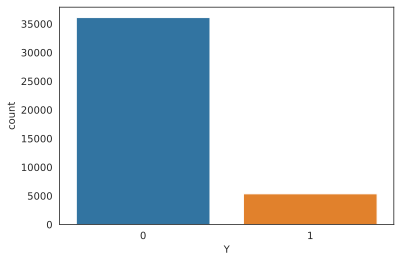

In [54]:
sns.countplot(x="Y", data=target);

In [55]:
# Calculating the proportion of the target variable "Y"==1 in the data (12.9%)

target[target["Y"] == 1].count() / target.shape[0]

Y    0.128954
dtype: float64

## Merging Datasets

In [56]:
# Merging the feature variables and the target variable

data = pd.merge(data, target, how="inner", on="ID")
data

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,INCOME,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,YEARS_BIRTH,YEARS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,Y
0,5008804,M,Y,Y,0,427.5,Working,Higher education,Civil marriage,Rented apartment,32,12.0,1,1,0,0,NaN,2.0,1
1,5008805,M,Y,Y,0,427.5,Working,Higher education,Civil marriage,Rented apartment,32,12.0,1,1,0,0,NaN,2.0,1
2,5008806,M,Y,Y,0,112.5,Working,Secondary / secondary special,Married,House / apartment,58,3.0,1,0,0,0,Security staff,2.0,0
3,5008808,F,N,Y,0,270.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,52,8.0,1,0,1,1,Sales staff,1.0,0
4,5008810,F,N,Y,0,270.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,52,8.0,1,0,1,1,Sales staff,1.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33105,5149828,M,Y,Y,0,315.0,Working,Secondary / secondary special,Married,House / apartment,47,6.0,1,0,0,0,Managers,2.0,1
33106,5149834,F,N,Y,0,157.5,Commercial associate,Higher education,Married,House / apartment,33,3.0,1,0,1,1,Medicine staff,2.0,1
33107,5149838,F,N,Y,0,157.5,Pensioner,Higher education,Married,House / apartment,33,3.0,1,0,1,1,Medicine staff,2.0,1
33108,5150049,F,N,Y,0,283.5,Working,Secondary / secondary special,Married,House / apartment,49,1.0,1,0,0,0,Sales staff,2.0,1


In [57]:
# Checking how many records are missing in the merged data

data.isnull().sum()

ID                         0
CODE_GENDER                0
FLAG_OWN_CAR               0
FLAG_OWN_REALTY            0
CNT_CHILDREN               0
INCOME                     0
NAME_INCOME_TYPE           0
NAME_EDUCATION_TYPE        0
NAME_FAMILY_STATUS         0
NAME_HOUSING_TYPE          0
YEARS_BIRTH                0
YEARS_EMPLOYED          5642
FLAG_MOBIL                 0
FLAG_WORK_PHONE            0
FLAG_PHONE                 0
FLAG_EMAIL                 0
OCCUPATION_TYPE        10373
CNT_FAM_MEMBERS            0
Y                          0
dtype: int64

## Charts of the Data

In [0]:
# We developed a function to graph different variables at the same time. In this function we can see how many variables does one column has. 
# The function requires to specify dataframe, number of graphs to be displayed and number of graphs per row.
# Distribution graphs (histogram/bar graph) of column data

def plotPerColumnDistribution(df, nGraphShown, nGraphPerRow):
    nunique = df.nunique()
    df = df[[col for col in df if nunique[col] > 1 and nunique[col] < 50]] # For displaying purposes, pick columns that have between 1 and 50 unique values
    nRow, nCol = df.shape
    columnNames = list(df)
    nGraphRow = (nCol + nGraphPerRow - 1) / nGraphPerRow
    plt.figure(num = None, figsize = (4 * nGraphPerRow, 4 * nGraphRow), dpi = 50, facecolor = 'w', edgecolor = 'k')
    for i in range(min(nCol, nGraphShown)):
        plt.subplot(nGraphRow, nGraphPerRow, i + 1)
        columnDf = df.iloc[:, i]
        if (not np.issubdtype(type(columnDf.iloc[0]), np.number)):
            valueCounts = columnDf.value_counts()
            valueCounts.plot.bar()
        else:
            columnDf.hist()
        plt.ylabel('counts')
        plt.xticks(rotation = 90)
        plt.title(f'{columnNames[i]} (column {i})')
    plt.tight_layout(pad = 1.0, w_pad = 1.0, h_pad = 1.0)
    plt.show()

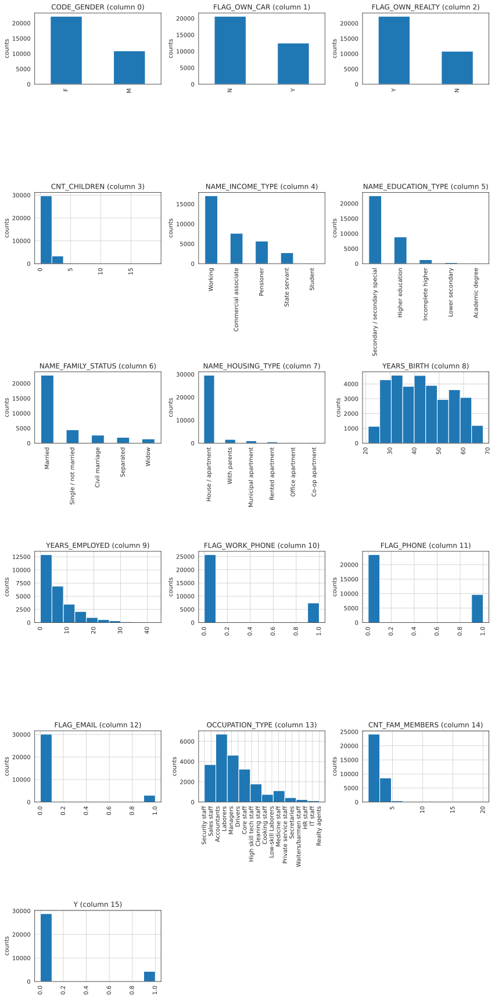

In [59]:
# Variables
plotPerColumnDistribution(data, 30, 3)
# We plotted 16 different bar charts with one function. 
# Findings from data file: There are almost twice as many females than men. 
# About 25K of the population is married  
# Nearly 30K of the population have 0 - 2 kids
# Most of the people in the population live in their own house
# The population age is concentrated between 30 to 50 years
# Most of the population is fewer than 10 years employed
# There are around 25K telephone numbers and 30K emails in these records

In [60]:
# Summary statistics of the merged data

data.describe()

,ID,CNT_CHILDREN,INCOME,YEARS_BIRTH,YEARS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,Y
count,3.311000e+04,33110.000000,33110.000000,33110.000000,27468.000000,33110.0,33110.000000,33110.000000,33110.000000,33110.000000,33110.000000
mean,5.078015e+06,0.427756,185.877171,43.347901,6.791648,1.0,0.224011,0.292419,0.090396,2.194654,0.129477
std,4.187679e+04,0.741716,101.412408,11.545784,6.505598,0.0,0.416936,0.454881,0.286752,0.911076,0.335733
min,5.008804e+06,0.000000,27.000000,21.000000,0.000000,1.0,0.000000,0.000000,0.000000,1.000000,0.000000
25%,5.041983e+06,0.000000,121.500000,34.000000,2.000000,1.0,0.000000,0.000000,0.000000,2.000000,0.000000
50%,5.069441e+06,0.000000,157.500000,42.000000,5.000000,1.0,0.000000,0.000000,0.000000,2.000000,0.000000
75%,5.114633e+06,1.000000,225.000000,53.000000,9.000000,1.0,0.000000,1.000000,0.000000,3.000000,0.000000
max,5.150487e+06,19.000000,1575.000000,68.000000,43.000000,1.0,1.000000,1.000000,1.000000,20.000000,1.000000


In [61]:
# Corrleation matrix of the data

data.corr()

,ID,CNT_CHILDREN,INCOME,YEARS_BIRTH,YEARS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,Y
ID,1.000000,0.026094,-0.012722,-0.053950,-0.027980,NaN,0.080844,0.013876,-0.047297,0.022572,0.005872
CNT_CHILDREN,0.026094,1.000000,0.037617,-0.341168,-0.059413,NaN,0.048964,-0.016430,0.020126,0.888412,0.013731
INCOME,-0.012722,0.037617,1.000000,-0.070587,0.022680,NaN,-0.033096,0.018423,0.092916,0.025476,0.028840
YEARS_BIRTH,-0.053950,-0.341168,-0.070587,1.000000,0.341343,NaN,-0.178844,0.025233,-0.106857,-0.303380,-0.033968
YEARS_EMPLOYED,-0.027980,-0.059413,0.022680,0.341343,1.000000,NaN,0.013025,0.046115,-0.045441,-0.044353,-0.007388
FLAG_MOBIL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
FLAG_WORK_PHONE,0.080844,0.048964,-0.033096,-0.178844,0.013025,NaN,1.000000,0.314704,-0.032959,0.063232,0.001438
FLAG_PHONE,0.013876,-0.016430,0.018423,0.025233,0.046115,NaN,0.314704,1.000000,0.013613,-0.004784,-0.004470
FLAG_EMAIL,-0.047297,0.020126,0.092916,-0.106857,-0.045441,NaN,-0.032959,0.013613,1.000000,0.018313,0.019914
CNT_FAM_MEMBERS,0.022572,0.888412,0.025476,-0.303380,-0.044353,NaN,0.063232,-0.004784,0.018313,1.000000,0.011308


[Text(0.5, 0, 'ID'),
 Text(1.5, 0, 'CNT_CHILDREN'),
 Text(2.5, 0, 'INCOME'),
 Text(3.5, 0, 'YEARS_BIRTH'),
 Text(4.5, 0, 'YEARS_EMPLOYED'),
 Text(5.5, 0, 'FLAG_MOBIL'),
 Text(6.5, 0, 'FLAG_WORK_PHONE'),
 Text(7.5, 0, 'FLAG_PHONE'),
 Text(8.5, 0, 'FLAG_EMAIL'),
 Text(9.5, 0, 'CNT_FAM_MEMBERS'),
 Text(10.5, 0, 'Y')]

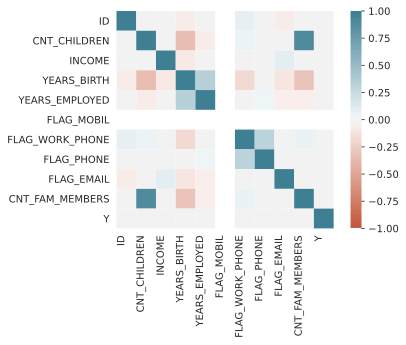

In [62]:
# In this code we are calculating the correlations for each variable and making a seaborn heatmap
# The colors in dark green show positive correlation while the red color shows negative correlation.
# Findings:  
# There is almost a correlation of 1 between family members and number of children. This proves that data is OK.
# We expected to have a stronger correlation between the years employed and years of birth.
 
corr = data.corr()
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=90, horizontalalignment='right')

In [0]:
# Creating a subset of the data so we can plot it in the next cell (otherwise too many records to plot)

data_subset = data.head(10000)

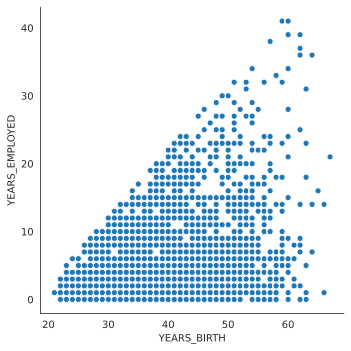

In [64]:
sns.relplot(x="YEARS_BIRTH", y="YEARS_EMPLOYED", data=data_subset);

[]

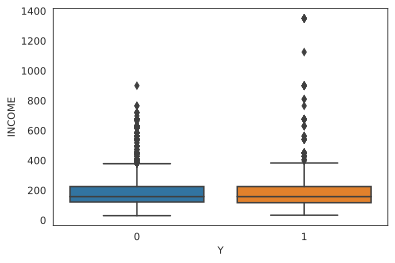

In [65]:
sns.boxplot(x='Y', y='INCOME', data=data_subset)
plt.plot()

## Creating Dummies

In [0]:
# Creating data with dummies

data_w_dummies = pd.get_dummies(data, drop_first=True)

In [67]:
# Info about the data with dummies

data_w_dummies.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 33110 entries, 0 to 33109
Data columns (total 48 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   ID                                                 33110 non-null  int64  
 1   CNT_CHILDREN                                       33110 non-null  int64  
 2   INCOME                                             33110 non-null  float64
 3   YEARS_BIRTH                                        33110 non-null  int64  
 4   YEARS_EMPLOYED                                     27468 non-null  float64
 5   FLAG_MOBIL                                         33110 non-null  int64  
 6   FLAG_WORK_PHONE                                    33110 non-null  int64  
 7   FLAG_PHONE                                         33110 non-null  int64  
 8   FLAG_EMAIL                                         33110 non-null  int64  
 9   CNT_FA

In [68]:
# Describe the data with dummies

data_w_dummies.describe()

,ID,CNT_CHILDREN,INCOME,YEARS_BIRTH,YEARS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,Y,CODE_GENDER_M,FLAG_OWN_CAR_Y,FLAG_OWN_REALTY_Y,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff
count,3.311000e+04,33110.000000,33110.000000,33110.000000,27468.000000,33110.0,33110.000000,33110.000000,33110.000000,33110.000000,33110.000000,33110.000000,33110.000000,33110.000000,33110.000000,33110.000000,33110.000000,33110.000000,33110.000000,33110.000000,33110.00000,33110.000000,33110.000000,33110.000000,33110.000000,33110.000000,33110.000000,33110.000000,33110.000000,33110.000000,33110.000000,33110.000000,33110.000000,33110.000000,33110.000000,33110.000000,33110.000000,33110.000000,33110.000000,33110.000000,33110.000000,33110.000000,33110.000000,33110.000000,33110.000000,33110.000000,33110.000000,33110.000000
mean,5.078015e+06,0.427756,185.877171,43.347901,6.791648,1.0,0.224011,0.292419,0.090396,2.194654,0.129477,0.328904,0.377288,0.673150,0.170915,0.082634,0.000332,0.515766,0.268529,0.039021,0.01039,0.681184,0.686349,0.057626,0.133887,0.041921,0.893355,0.030655,0.007309,0.016188,0.048263,0.015433,0.017729,0.098158,0.058411,0.002295,0.038327,0.001722,0.169163,0.004802,0.081395,0.033947,0.008849,0.002024,0.095319,0.004289,0.016521,0.004923
std,4.187679e+04,0.741716,101.412408,11.545784,6.505598,0.0,0.416936,0.454881,0.286752,0.911076,0.335733,0.469822,0.484715,0.469069,0.376440,0.275332,0.018224,0.499759,0.443201,0.193649,0.10140,0.466025,0.463984,0.233039,0.340536,0.200411,0.308665,0.172385,0.085181,0.126202,0.214325,0.123271,0.131966,0.297532,0.234523,0.047856,0.191987,0.041456,0.374902,0.069132,0.273445,0.181097,0.093655,0.044939,0.293659,0.065349,0.127469,0.069992
min,5.008804e+06,0.000000,27.000000,21.000000,0.000000,1.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,5.041983e+06,0.000000,121.500000,34.000000,2.000000,1.0,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,5.069441e+06,0.000000,157.500000,42.000000,5.000000,1.0,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.00000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000

In [69]:
# Drop observations with missing values

data_w_dummies.dropna(axis=0, inplace=True)
data_w_dummies

,ID,CNT_CHILDREN,INCOME,YEARS_BIRTH,YEARS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,Y,CODE_GENDER_M,FLAG_OWN_CAR_Y,FLAG_OWN_REALTY_Y,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff
0,5008804,0,427.5,32,12.0,1,1,0,0,2.0,1,1,1,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,5008805,0,427.5,32,12.0,1,1,0,0,2.0,1,1,1,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,5008806,0,112.5,58,3.0,1,0,0,0,2.0,0,1,1,1,0,0,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
3,5008808,0,270.0,52,8.0,1,0,1,1,1.0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
4,5008810,0,270.0,52,8.0,1,0,1,1,1.0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33105,5149828,0,315.0,47,6.0,1,0,0,0,2.0,1,1,1,1,0,0,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
33106,5149834,0,157.5,33,3.0,1,0,1,1,2.0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
33107,5149838,0,157.5,33,3.0,1,0,1,1,2.0,1,0,0,1,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
33108,5150049,0,283.5,49,1.0,1,0,0,0,2.0,1,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0


In [70]:
data_w_dummies.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27468 entries, 0 to 33109
Data columns (total 48 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   ID                                                 27468 non-null  int64  
 1   CNT_CHILDREN                                       27468 non-null  int64  
 2   INCOME                                             27468 non-null  float64
 3   YEARS_BIRTH                                        27468 non-null  int64  
 4   YEARS_EMPLOYED                                     27468 non-null  float64
 5   FLAG_MOBIL                                         27468 non-null  int64  
 6   FLAG_WORK_PHONE                                    27468 non-null  int64  
 7   FLAG_PHONE                                         27468 non-null  int64  
 8   FLAG_EMAIL                                         27468 non-null  int64  
 9   CNT_FA

## Feature Importance
We see that INCOME, YEARS_BIRTH and YEARS_EMPLOYED have the highest importance.

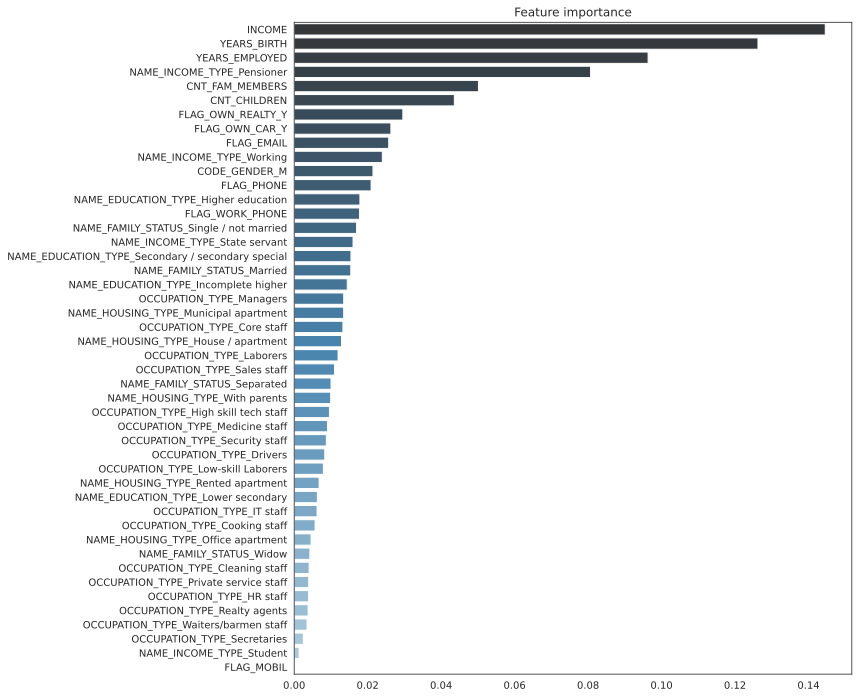

In [71]:
# Creating a dictionary of the model parameters

params = {'random_state': 0, 'n_jobs': 4, 'n_estimators': 1000, 'max_depth': 8}

# Setting the feature matrix and target variable

X, y = data_w_dummies.drop(["ID", "Y"], axis=1), data_w_dummies["Y"]

# Fit Random Forest Classifier

clf = RandomForestClassifier(**params)
clf = clf.fit(X, y)

# Plot features importances

imp = pd.Series(data=clf.feature_importances_, index=X.columns).sort_values(ascending=False)
plt.figure(figsize=(10,12))
plt.title("Feature importance")
ax = sns.barplot(y=imp.index, x=imp.values, palette="Blues_d", orient='h')

## Data Plots

[]

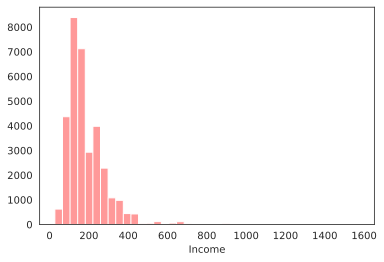

In [72]:
# Histrogram of Income

sns.distplot(data['INCOME'], 
             bins=40, hist = True, 
             color = 'Red', 
             kde=False, 
             axlabel='Income')
plt.plot()

[]

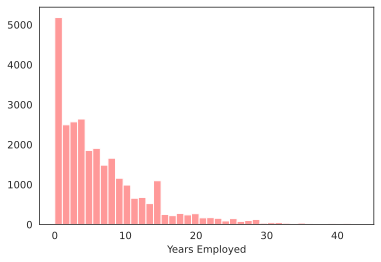

In [73]:
# Histrogram of Years Employed

sns.distplot(data['YEARS_EMPLOYED'], 
             bins=40, hist = True, 
             color = 'Red', 
             kde=False, 
             axlabel='Years Employed')
plt.plot()

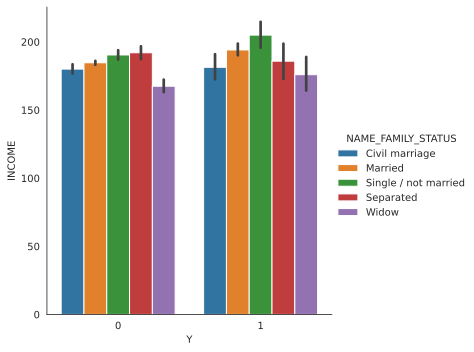

In [74]:
# Catplot of "Y" with Income and Family Status

sns.catplot(x="Y", y="INCOME", hue="NAME_FAMILY_STATUS", kind="bar", data=data);

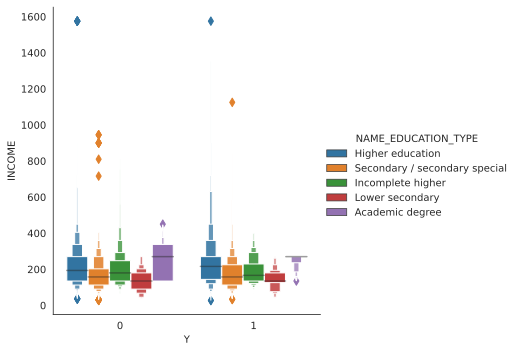

In [75]:
# Boxen categorial plot of "Y" with Income and Education type

sns.catplot(x="Y", y="INCOME", hue="NAME_EDUCATION_TYPE", kind="boxen", data=data);

[]

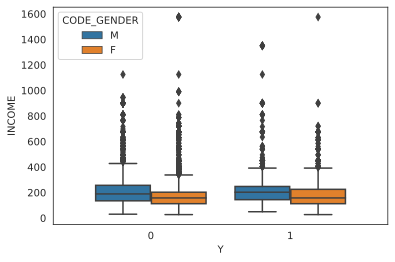

In [76]:
# Box plot of "Y" with Income and Gender

sns.boxplot(x='Y', y='INCOME', data=data, dodge=True, hue='CODE_GENDER')
plt.plot()

[]

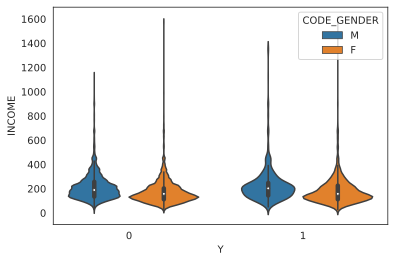

In [77]:
# Violin plot of "Y" with Income and Gender

sns.violinplot(x='Y', y='INCOME', data=data, dodge=True, hue='CODE_GENDER')
plt.plot()

[]

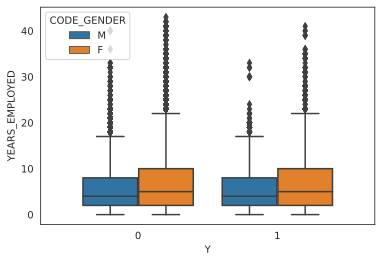

In [78]:
# Box plot of "Y" with Years Employed and Gender 

sns.boxplot(x='Y', y='YEARS_EMPLOYED', data=data, hue='CODE_GENDER',)
plt.plot()


[]

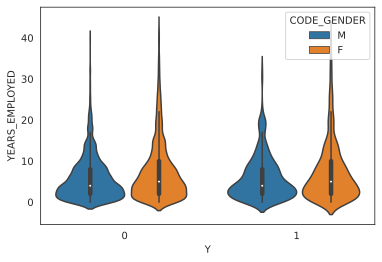

In [79]:
# Violin plot of "Y" with Years Employed and Gender  

sns.violinplot(x='Y', y='YEARS_EMPLOYED', data=data, hue='CODE_GENDER')
plt.plot()

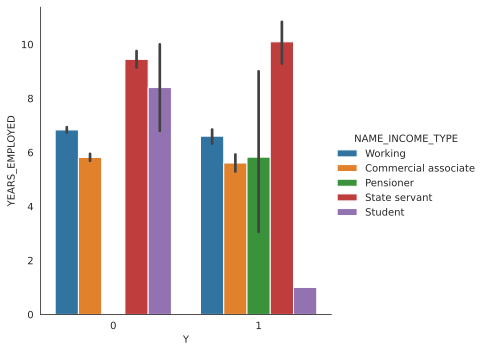

In [80]:
# Categorical plot of "Y" with with Years Employed and Income Type 

sns.catplot(x="Y", y="YEARS_EMPLOYED", kind="bar", hue= 'NAME_INCOME_TYPE', data=data);

# **CLASSIFICATION MODELS**

## PREPROCESSING

### CODE FOR THE CONFUSION MATRIX

In [0]:
# Code for the confusion matrix charts

import itertools
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        
    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [82]:
# Calculating the proportion of "Y" in the data. Before it was 12.9% but after removing some missing values it is 13.3%

data_w_dummies[data_w_dummies["Y"] == 1].count() / data_w_dummies.shape[0]

ID                                                   0.133355
CNT_CHILDREN                                         0.133355
INCOME                                               0.133355
YEARS_BIRTH                                          0.133355
YEARS_EMPLOYED                                       0.133355
FLAG_MOBIL                                           0.133355
FLAG_WORK_PHONE                                      0.133355
FLAG_PHONE                                           0.133355
FLAG_EMAIL                                           0.133355
CNT_FAM_MEMBERS                                      0.133355
Y                                                    0.133355
CODE_GENDER_M                                        0.133355
FLAG_OWN_CAR_Y                                       0.133355
FLAG_OWN_REALTY_Y                                    0.133355
NAME_INCOME_TYPE_Pensioner                           0.133355
NAME_INCOME_TYPE_State servant                       0.133355
NAME_INC

In [83]:
# Creating the feature matrix and the target vector

X = data_w_dummies.drop(["Y", "ID"], axis=1)
y = data_w_dummies["Y"]

X

,CNT_CHILDREN,INCOME,YEARS_BIRTH,YEARS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,CODE_GENDER_M,FLAG_OWN_CAR_Y,FLAG_OWN_REALTY_Y,NAME_INCOME_TYPE_Pensioner,NAME_INCOME_TYPE_State servant,NAME_INCOME_TYPE_Student,NAME_INCOME_TYPE_Working,NAME_EDUCATION_TYPE_Higher education,NAME_EDUCATION_TYPE_Incomplete higher,NAME_EDUCATION_TYPE_Lower secondary,NAME_EDUCATION_TYPE_Secondary / secondary special,NAME_FAMILY_STATUS_Married,NAME_FAMILY_STATUS_Separated,NAME_FAMILY_STATUS_Single / not married,NAME_FAMILY_STATUS_Widow,NAME_HOUSING_TYPE_House / apartment,NAME_HOUSING_TYPE_Municipal apartment,NAME_HOUSING_TYPE_Office apartment,NAME_HOUSING_TYPE_Rented apartment,NAME_HOUSING_TYPE_With parents,OCCUPATION_TYPE_Cleaning staff,OCCUPATION_TYPE_Cooking staff,OCCUPATION_TYPE_Core staff,OCCUPATION_TYPE_Drivers,OCCUPATION_TYPE_HR staff,OCCUPATION_TYPE_High skill tech staff,OCCUPATION_TYPE_IT staff,OCCUPATION_TYPE_Laborers,OCCUPATION_TYPE_Low-skill Laborers,OCCUPATION_TYPE_Managers,OCCUPATION_TYPE_Medicine staff,OCCUPATION_TYPE_Private service staff,OCCUPATION_TYPE_Realty agents,OCCUPATION_TYPE_Sales staff,OCCUPATION_TYPE_Secretaries,OCCUPATION_TYPE_Security staff,OCCUPATION_TYPE_Waiters/barmen staff
0,0,427.5,32,12.0,1,1,0,0,2.0,1,1,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,427.5,32,12.0,1,1,0,0,2.0,1,1,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,112.5,58,3.0,1,0,0,0,2.0,1,1,1,0,0,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
3,0,270.0,52,8.0,1,0,1,1,1.0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
4,0,270.0,52,8.0,1,0,1,1,1.0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33105,0,315.0,47,6.0,1,0,0,0,2.0,1,1,1,0,0,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
33106,0,157.5,33,3.0,1,0,1,1,2.0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
33107,0,157.5,33,3.0,1,0,1,1,2.0,0,0,1,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
33108,0,283.5,49,1.0,1,0,0,0,2.0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0


### SPLITTING THE DATASET

In [0]:
# Splitting the dataset into train and test data

X_train_unbalanced, X_test, y_train_unbalanced, y_test = train_test_split(X, y, 
                                                    test_size=0.3, random_state=42)

### SMOTE

In [85]:
# SMOTE balances the samples (increases the minority samples) and improves the prediction of the minority class
# SMOTE is applied only on the training data

X_train, y_train = SMOTE(random_state=42).fit_resample(X_train_unbalanced, y_train_unbalanced)  

X_train = pd.DataFrame(X_train, columns=X.columns)

# The two classes are now balanced (50%)

print("The new balanced proportion of the target variable is: {}".format(y_train.sum() / y_train.shape[0]))

The new balanced proportion of the target variable is: 0.5


/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


### SCALING THE DATA

In [86]:
# Scaling the data with mean=0 and std=1

scaler = StandardScaler()  

scaler.fit(X_train)                    # fit only on training data

X_train = scaler.transform(X_train)   

X_test = scaler.transform(X_test)      # apply the same transformation to test data

print("The mean of the train data is: {}".format(round(X_train.mean(), 3)))
print("The St.D. of the train data is: {}".format(round(X_train.std(), 3)))
print("The mean of the test data is: {}".format(round(X_test.mean(), 3)))
print("The St.D. of the test data is: {}".format(round(X_test.std(), 3)))

The mean of the train data is: 0.0
The St.D. of the train data is: 0.989
The mean of the test data is: 0.004
The St.D. of the test data is: 1.039


## **DECISION TREE**

### Model

In [87]:
# Running the Decision Tree and calculating its accuracy

decision_tree = DecisionTreeClassifier(random_state=42, 
                                       min_samples_leaf=10, 
                                       min_samples_split=10)

decision_tree.fit(X_train, y_train)

decision_tree.score(X_test, y_test)

0.8330299720907657

In [88]:
# AUC score for Decision Tree

y_pred_prob = decision_tree.predict_proba(X_test)[:, 1]

roc_auc_score(y_test, y_pred_prob)

0.710290956910887

### Classification Report

In [89]:
# Classification report

y_predict = decision_tree.predict(X_test)

print(classification_report(y_test, y_predict))

              precision    recall  f1-score   support

           0       0.90      0.91      0.90      7144
           1       0.37      0.36      0.36      1097

    accuracy                           0.83      8241
   macro avg       0.63      0.63      0.63      8241
weighted avg       0.83      0.83      0.83      8241



### Confusion Matrix

[[0.90635498 0.09364502]
 [0.64448496 0.35551504]]


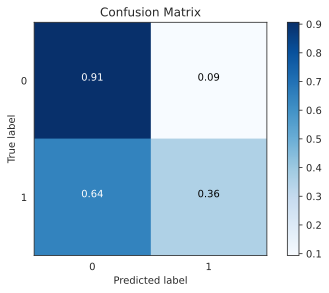

In [90]:
# Confusion Matrix

class_names = ['0', '1']

plot_confusion_matrix(confusion_matrix(y_test, y_predict),
                      classes=class_names, normalize=True, 
                      title='Confusion Matrix')

## **RANDOM FOREST**

### Model

In [91]:
# Fitting Random Forest Classifier and calculating the accuracy score

random_forest = RandomForestClassifier()

random_forest.fit(X_train, y_train)

random_forest.score(X_test, y_test)

0.8611818954010436

In [92]:
# AUC score for Random Forest Classifier

y_pred_prob = random_forest.predict_proba(X_test)[:, 1]

roc_auc_score(y_test, y_pred_prob)

0.7966029081655047

### Classification Report

In [93]:
# Classification report for Random Forest Classifier

y_predict = random_forest.predict(X_test)

print(classification_report(y_test, y_predict))

              precision    recall  f1-score   support

           0       0.91      0.93      0.92      7144
           1       0.48      0.41      0.44      1097

    accuracy                           0.86      8241
   macro avg       0.69      0.67      0.68      8241
weighted avg       0.85      0.86      0.86      8241



### Confusion Matrix

[[0.93029115 0.06970885]
 [0.58887876 0.41112124]]


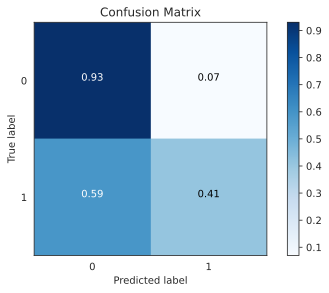

In [94]:
# Confusion Matrix for Random Forest Classifier

class_names = ['0', '1']

plot_confusion_matrix(confusion_matrix(y_test, y_predict),
                      classes=class_names, normalize=True, 
                      title='Confusion Matrix')

## **SUPPORT VECTOR MACHINE**

### Model

In [95]:
# Fitting SVM Classifier and calculating the accuracy score

svm = LinearSVC(max_iter=10000, random_state=42)

svm.fit(X_train, y_train)

svm.score(X_test, y_test)

/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


0.56582938963718

In [0]:
# AUC score for SVM

# SVM Classifier doesn't support .predict_proba so AUC can't be calculated

# y_pred_prob = svm.predict_proba(X_test)[:, 1]

# roc_auc_score(y_test, y_pred_prob)


### Classification Report

In [96]:
# Classification report for Random Forest Classifier

y_predict = svm.predict(X_test)

print(classification_report(y_test, y_predict))


              precision    recall  f1-score   support

           0       0.88      0.58      0.70      7144
           1       0.15      0.50      0.24      1097

    accuracy                           0.57      8241
   macro avg       0.52      0.54      0.47      8241
weighted avg       0.79      0.57      0.64      8241



### Confusion Matrix

[[0.57544793 0.42455207]
 [0.49680948 0.50319052]]


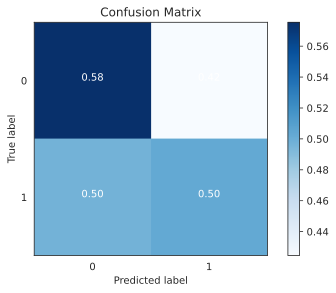

In [97]:
# Confusion Matrix for SVM Classifier

class_names = ['0', '1']

plot_confusion_matrix(confusion_matrix(y_test, y_predict),
                      classes=class_names, normalize=True, 
                      title='Confusion Matrix')


## **K-NN CLASSIFIER**

**K-nearest neighbor or K-NN algorithm** creates an imaginary boundary to classify the data.

K-NN is a non-parametric and lazy learning algorithm • Non-parametric = There is no underlying data distribution. Most of real-life data sets don’t follow normal distributions, etc. • Lazy learning = does not need any training data points for model generation. Training is faster, but testing phase is slower and requires more memory storage (training). K-NN needs more time to scan every data point.

In K-NN, K is the number of nearest neighbors. The number of neighbors is the core deciding factor.

How does the model work?

1. Calculate distance between a given point and neighbors
2. Find closest neighbors
3. Vote for labels

![alt text](https://res.cloudinary.com/dyd911kmh/image/upload/f_auto,q_auto:best/v1531424125/KNN_final1_ibdm8a.png)

### Model

In [98]:
# K-NN
  
knn = KNeighborsClassifier(n_neighbors=7) 
  
knn.fit(X_train, y_train) 
  
knn.score(X_test, y_test)

0.807304938721029

In [99]:
# AUC score for K-NN Classifier

y_pred_prob = knn.predict_proba(X_test)[:, 1]

roc_auc_score(y_test, y_pred_prob)

0.7409426706859081

### Classification Report

In [100]:
# Classification report for K-NN

y_predict = knn.predict(X_test)

print(classification_report(y_test, y_predict))

              precision    recall  f1-score   support

           0       0.92      0.85      0.88      7144
           1       0.35      0.51      0.41      1097

    accuracy                           0.81      8241
   macro avg       0.63      0.68      0.65      8241
weighted avg       0.84      0.81      0.82      8241



### Confusion Matrix

[[0.85288354 0.14711646]
 [0.48951686 0.51048314]]


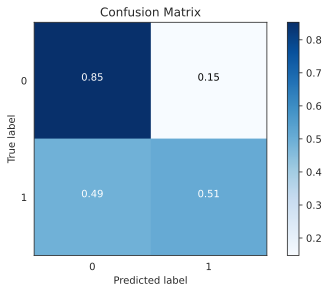

In [101]:
# Confusion Matrix for K-NN

class_names = ['0', '1']

plot_confusion_matrix(confusion_matrix(y_test, y_predict),
                      classes=class_names, normalize=True, 
                      title='Confusion Matrix')

### Can we improve the model?
As shown in the chart below, changing the number of neighors (K) improves the performace of the model on the testing data.

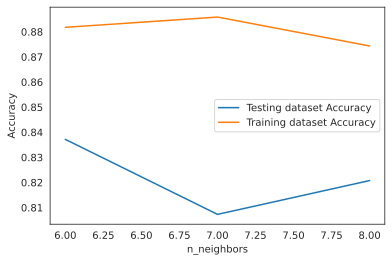

In [102]:
# Can we improve the model?

neighbors = np.arange(6, 9) 
train_accuracy = np.empty(len(neighbors)) 
test_accuracy = np.empty(len(neighbors)) 
  
# Loop over K values 
for i, k in enumerate(neighbors): 
    knn = KNeighborsClassifier(n_neighbors=k) 
    knn.fit(X_train, y_train) 
      
    # Compute traning and test data accuracy 
    train_accuracy[i] = knn.score(X_train, y_train) 
    test_accuracy[i] = knn.score(X_test, y_test) 
  
# Generate plot 
plt.plot(neighbors, test_accuracy, label = 'Testing dataset Accuracy') 
plt.plot(neighbors, train_accuracy, label = 'Training dataset Accuracy') 
  
plt.legend() 
plt.xlabel('n_neighbors') 
plt.ylabel('Accuracy') 
plt.show()

## **LOGISTIC REGRESSION**

### Model

In [103]:
# Logistic Regression

logistic = LogisticRegression(random_state=42, solver='liblinear')

logistic.fit(X_train, y_train)

logistic.score(X_test, y_test)

0.5655867006431259

In [104]:
# AUC score for Logistic Regression

y_pred_prob = logistic.predict_proba(X_test)[:, 1]

roc_auc_score(y_test, y_pred_prob)

0.5490225301417588

### Classification Report

In [105]:
# Classification report for Logistic Regression

y_predict = logistic.predict(X_test)

print(classification_report(y_test, y_predict))

              precision    recall  f1-score   support

           0       0.88      0.58      0.70      7144
           1       0.15      0.50      0.24      1097

    accuracy                           0.57      8241
   macro avg       0.52      0.54      0.47      8241
weighted avg       0.79      0.57      0.64      8241



### Confusion Matrix

[[0.57516797 0.42483203]
 [0.49680948 0.50319052]]


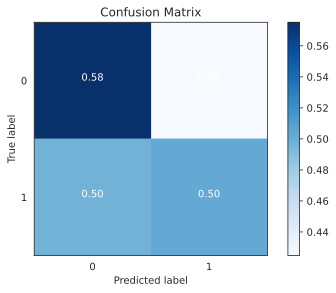

In [106]:
# Confusion Matrix for Logistic Regression

class_names = ['0', '1']

plot_confusion_matrix(confusion_matrix(y_test, y_predict),
                      classes=class_names, normalize=True, 
                      title='Confusion Matrix')

## **GAUSSIAN NB**

### Model

In [107]:
# GaussianNB

gaussian = GaussianNB()

gaussian.fit(X_train, y_train)

gaussian.score(X_test, y_test)

0.8634874408445578

In [108]:
# AUC score for GaussianNB

y_pred_prob = gaussian.predict_proba(X_test)[:, 1]

roc_auc_score(y_test, y_pred_prob)

0.5056142885871169

### Classification Report

In [109]:
# Classification report for GaussianNB

y_predict = gaussian.predict(X_test)

print(classification_report(y_test, y_predict))

              precision    recall  f1-score   support

           0       0.87      0.99      0.93      7144
           1       0.26      0.01      0.03      1097

    accuracy                           0.86      8241
   macro avg       0.56      0.50      0.48      8241
weighted avg       0.79      0.86      0.81      8241



### Confusion Matrix

[[0.99398096 0.00601904]
 [0.98632634 0.01367366]]


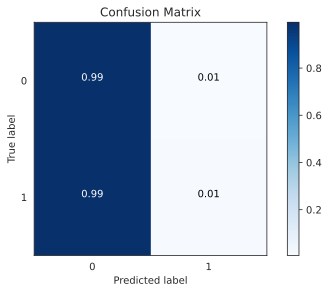

In [110]:
# Confusion Matrix for GaussianNB

class_names = ['0', '1']

plot_confusion_matrix(confusion_matrix(y_test, y_predict),
                      classes=class_names, normalize=True, 
                      title='Confusion Matrix')

## **XGBOOST**

### Model

In [111]:
# XGBoost

xg_reg = xgb.XGBClassifier(objective ='binary:logistic', colsample_bytree=0.5, learning_rate=0.1,
                           max_depth=10, alpha=10, n_estimators=500)

xg_reg.fit(X_train, y_train)

xg_reg.score(X_test, y_test)

0.8632447518505035

In [112]:
# AUC score for XGBoost

y_pred_prob = xg_reg.predict_proba(X_test)[:, 1]

roc_auc_score(y_test, y_pred_prob)

0.7662770857300936

### Classification Report

In [113]:
# Classification report for XGBoost

y_predict = xg_reg.predict(X_test)

print(classification_report(y_test, y_predict))

              precision    recall  f1-score   support

           0       0.91      0.94      0.92      7144
           1       0.48      0.38      0.43      1097

    accuracy                           0.86      8241
   macro avg       0.70      0.66      0.67      8241
weighted avg       0.85      0.86      0.86      8241



### Confusion Matrix

[[0.9368701  0.0631299 ]
 [0.61622607 0.38377393]]


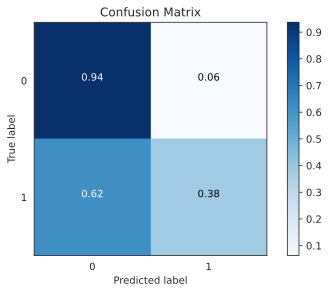

In [114]:
# Confusion Matrix for XGBoost

class_names = ['0', '1']

plot_confusion_matrix(confusion_matrix(y_test, y_predict),
                      classes=class_names, normalize=True, 
                      title='Confusion Matrix')

## EXTRA TREES CLASSIFIER

### Model

In [115]:
# Extra Trees

extra_trees = ExtraTreesClassifier(n_estimators=200, random_state=42)

extra_trees.fit(X_train, y_train)

extra_trees.score(X_test, y_test)

0.8610605509040165

In [116]:
# AUC score for Extra Trees

y_pred_prob = extra_trees.predict_proba(X_test)[:, 1]

roc_auc_score(y_test, y_pred_prob)

0.7828542237252977

### Classification Report

In [117]:
# Classification report

y_predict = extra_trees.predict(X_test)

print(classification_report(y_test, y_predict))

              precision    recall  f1-score   support

           0       0.91      0.93      0.92      7144
           1       0.47      0.39      0.43      1097

    accuracy                           0.86      8241
   macro avg       0.69      0.66      0.68      8241
weighted avg       0.85      0.86      0.86      8241



### Confusion Matrix

[[0.93295073 0.06704927]
 [0.6071103  0.3928897 ]]


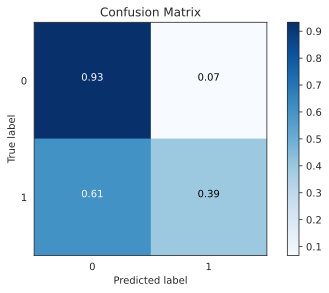

In [118]:
# Confusion Matrix

class_names = ['0', '1']

plot_confusion_matrix(confusion_matrix(y_test, y_predict),
                      classes=class_names, normalize=True, 
                      title='Confusion Matrix')

## STACKING CLASSIFIER

### Model

In [119]:
# Stacking Classifier

estimators = [('rf', RandomForestClassifier(n_estimators=X_train.shape[1], random_state=42)),
              ('svr', make_pipeline(StandardScaler(), LinearSVC(random_state=42)))]

stacking = StackingClassifier(estimators=estimators, final_estimator=LogisticRegression())

stacking.fit(X_train, y_train)

stacking.score(X_test, y_test)

/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarn

0.8614245843950977

In [120]:
# AUC score for Stacking Classifier

y_pred_prob = stacking.predict_proba(X_test)[:, 1]

roc_auc_score(y_test, y_pred_prob)

0.7993037613526047

### Classification Report

In [121]:
# Classification report

y_predict = stacking.predict(X_test)

print(classification_report(y_test, y_predict))

              precision    recall  f1-score   support

           0       0.91      0.93      0.92      7144
           1       0.48      0.44      0.46      1097

    accuracy                           0.86      8241
   macro avg       0.70      0.68      0.69      8241
weighted avg       0.86      0.86      0.86      8241



### Confusion Matrix

[[0.92665174 0.07334826]
 [0.5633546  0.4366454 ]]


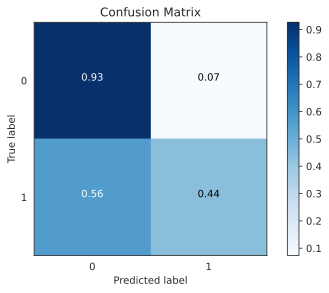

In [122]:
# Confusion Matrix

class_names = ['0', '1']

plot_confusion_matrix(confusion_matrix(y_test, y_predict),
                      classes=class_names, normalize=True, 
                      title='Confusion Matrix')

# **UNSUPERVISED LEARNING**

## Reduce Dimensions

PCA’s approach to data reduction is to create one or more index variables from a larger set of measured variables. It does this using a linear combination (weighted average) of a set of variables. The created index variables are called components.

In [0]:
pca = PCA(n_components=2)

pca.fit(X)

X_2D = pca.transform(X)

In [0]:
y_2D = pd.DataFrame(y)

y_2D['PCA1'] = X_2D[:, 0]

y_2D['PCA2'] = X_2D[:, 1]

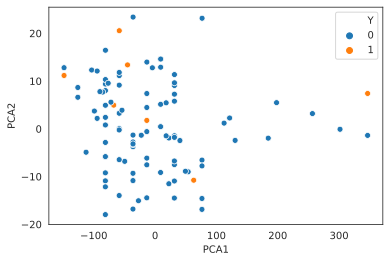

In [125]:
# Plotting a sample of 100 observations because plotting all observations slows down Colab

sns.scatterplot("PCA1", "PCA2", hue='Y', data=y_2D.sample(100));

### K-Means

K-Means algorithm is an iterative algorithm that partitions the dataset into K pre-defined distinct non-overlapping subgroups (clusters) where each data point belongs to only one group. It tries to make the inter-cluster data points as similar as possible while also keeping the clusters as different (far) as possible. It assigns data points to a cluster such that the sum of the squared distance between the data points and the cluster’s centroid (arithmetic mean of all the data points that belong to that cluster) is at the minimum. The less variation we have within clusters, the more homogeneous (similar) the data points are within the same cluster.

In [0]:
kmeans = KMeans(n_clusters=4, random_state=42)

kmeans.fit(X)

clusters = kmeans.predict(X)

y_2D['KMeans'] = clusters

In [127]:
sns.relplot("PCA1", "PCA2", hue='Y', data=y_2D, col='KMeans');

### Spectral Co-Clustering

The goal of co-clustering is to simultaneously cluster the rows and columns of an input data matrix. It overcomes several limitations associated with traditional clustering methods by allowing automatic discovery of similarity based on a subset of attributes. 

In [0]:
model = SpectralCoclustering(n_clusters=4, random_state=42)

model.fit(X)

y_2D['SpectralCoclustering'] = model.row_labels_

In [129]:
sns.relplot("PCA1", "PCA2", hue='Y', data=y_2D, col='SpectralCoclustering');

### Joint Clusters

Each clustering technique provides a label for each register, when combined they split the data more, creating some interesting subsets which can explain more than the original techniques.

In [0]:
y_2D["SpectralCoclustering"] = y_2D["SpectralCoclustering"].astype(str)

y_2D["KMeans"] = y_2D["KMeans"].astype(str)

y_2D["ClusterCombination"] = y_2D["SpectralCoclustering"].str.cat(y_2D["KMeans"], sep=',')

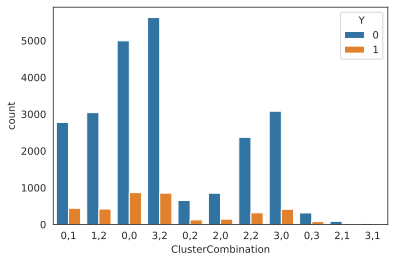

In [131]:
sns.countplot(x="ClusterCombination", hue="Y", data=y_2D);

In [132]:
sns.relplot("PCA1", "PCA2", hue='Y', data=y_2D, col='ClusterCombination', col_wrap=4,);